In [33]:
import rasterio
import numpy as np
from rasterio.plot import show
import matplotlib.pyplot as plt

In [34]:
lakeImage = rasterio.open('./Data/Rst/lakeImage.tif')
# lakeImage = rasterio.open('./Data Examen 3/Ex_1/Rst/landsatImage.tif')

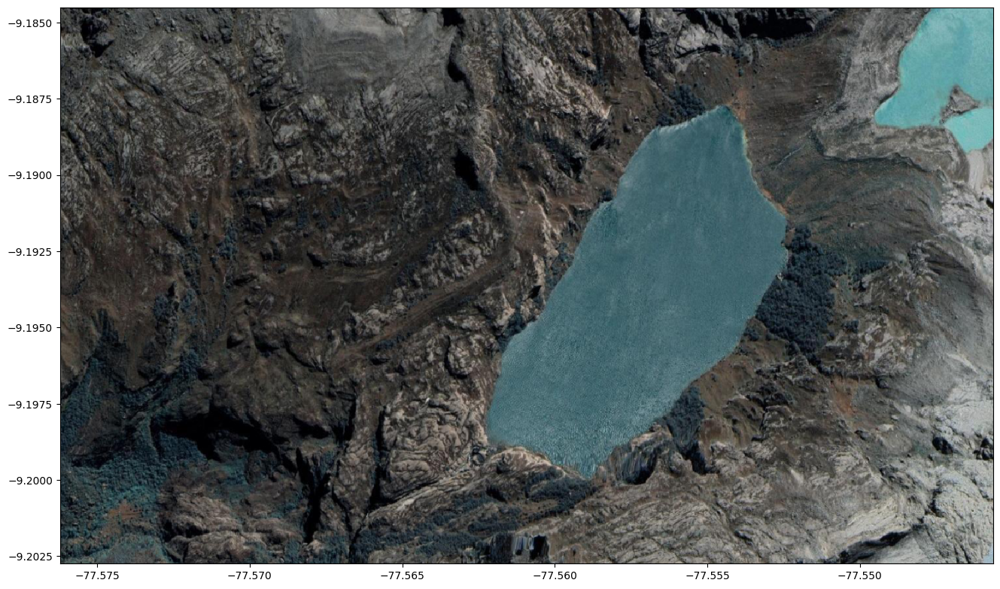

<Axes: >

In [35]:
fig, ax = plt.subplots(figsize=(16,12))
show(lakeImage)

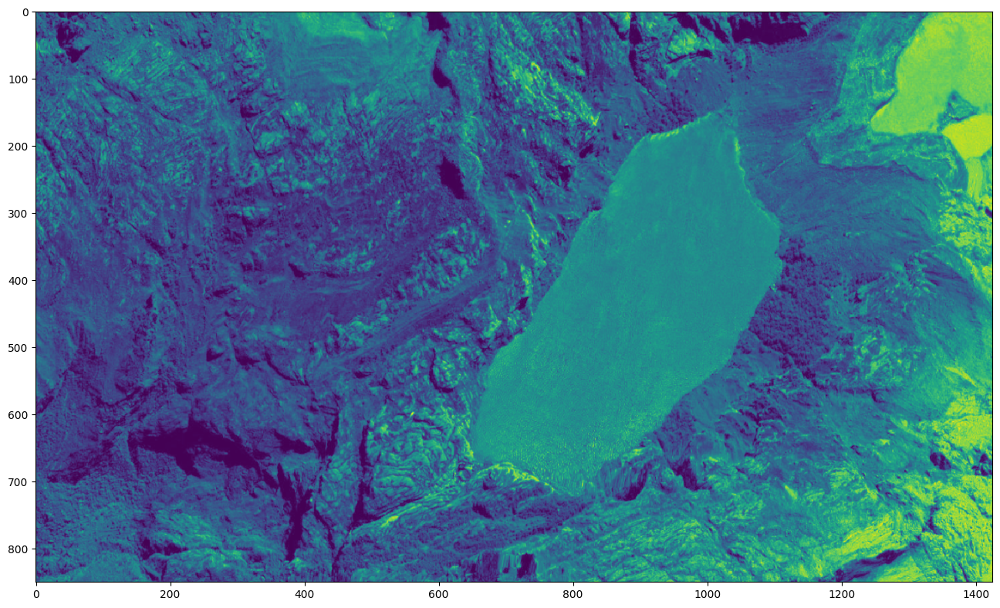

In [36]:
redBand, greenBand, blueBand = lakeImage.read(1), lakeImage.read(2), lakeImage.read(3)

#change data type
redBand = np.float32(redBand)
greenBand = np.float32(greenBand)
blueBand = np.float32(blueBand)

fig, ax = plt.subplots(figsize=(16,12))
plt.imshow(greenBand)

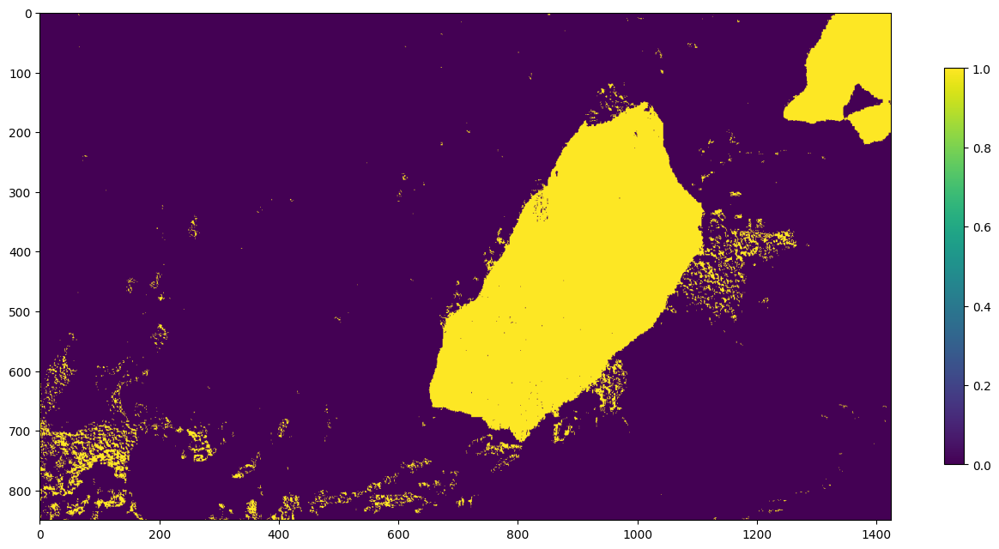

In [37]:
# fix green band
#greenBand[greenBand<=0] = 10

#calculate hatariIndex
hatariIndex = np.zeros(blueBand.shape)

hatariIndex[ (redBand < 0.4 * (greenBand+blueBand)) & (redBand >40)] = 1

fig, ax = plt.subplots(figsize=(16,12))
plt.imshow(hatariIndex)
plt.colorbar(shrink=0.5)

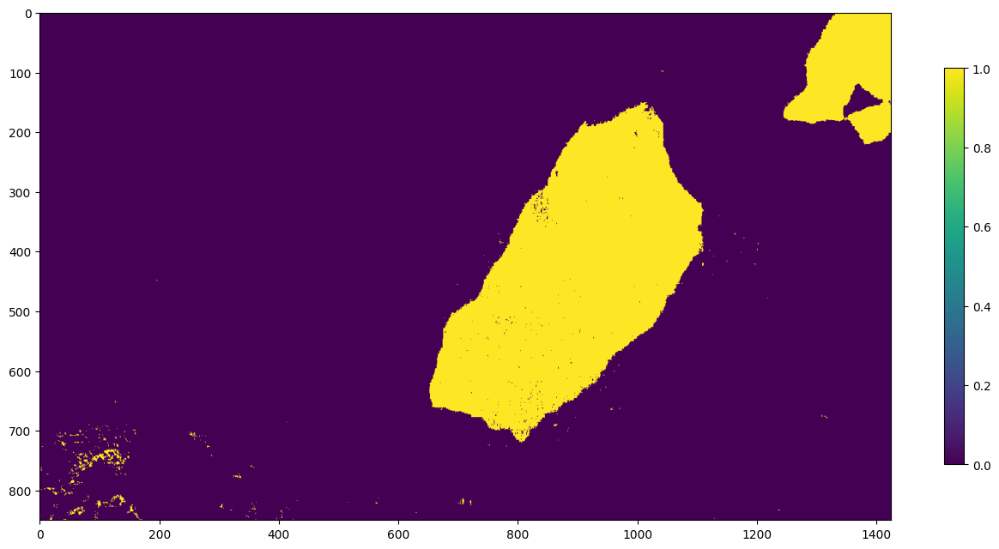

In [38]:
# fix green band
greenBand[greenBand<=0] = 10

#calculate hatariIndex
hatariIndex = np.zeros(blueBand.shape)

hatariIndex[ (redBand < 0.4 * (greenBand+blueBand)) & (redBand >40) & (greenBand >80) ] = 1

fig, ax = plt.subplots(figsize=(16,12))
plt.imshow(hatariIndex)
plt.colorbar(shrink=0.5)

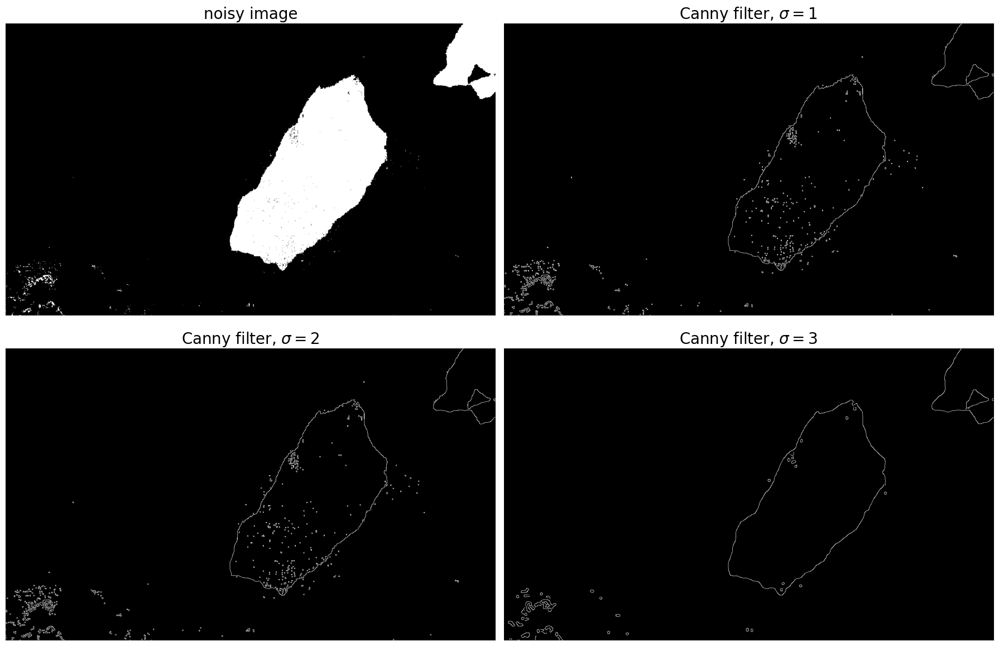

In [39]:
#!pip install scikit-image
from skimage import feature

# Canny filter

# Compute the Canny filter for two values of sigma
edgesS1 = feature.canny(hatariIndex, sigma=1)
edgesS2 = feature.canny(hatariIndex, sigma=1)
edgesS3 = feature.canny(hatariIndex, sigma=3)

# display results
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(18, 12),
                                    sharex=True, sharey=True)

ax1.imshow(hatariIndex, cmap=plt.cm.gray)
ax1.axis('off')
ax1.set_title('noisy image', fontsize=20)

ax2.imshow(edgesS1, cmap=plt.cm.gray)
ax2.axis('off')
ax2.set_title(r'Canny filter, $\sigma=1$', fontsize=20)

ax3.imshow(edgesS2, cmap=plt.cm.gray)
ax3.axis('off')
ax3.set_title(r'Canny filter, $\sigma=2$', fontsize=20)

ax4.imshow(edgesS3, cmap=plt.cm.gray)
ax4.axis('off')
ax4.set_title(r'Canny filter, $\sigma=3$', fontsize=20)

fig.tight_layout()

plt.show()

In [40]:
def cannyImage(band):
    # Compute the Canny filter for two values of sigma
    edgesS1 = feature.canny(band, sigma=1)
    edgesS2 = feature.canny(band, sigma=1)
    edgesS3 = feature.canny(band, sigma=3)

    # display results
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(18, 12),
                                        sharex=True, sharey=True)

    ax1.imshow(band, cmap=plt.cm.gray)
    ax1.axis('off')
    ax1.set_title('noisy image', fontsize=20)

    ax2.imshow(edgesS1, cmap=plt.cm.gray)
    ax2.axis('off')
    ax2.set_title(r'Canny filter, $\sigma=1$', fontsize=20)

    ax3.imshow(edgesS2, cmap=plt.cm.gray)
    ax3.axis('off')
    ax3.set_title(r'Canny filter, $\sigma=2$', fontsize=20)

    ax4.imshow(edgesS3, cmap=plt.cm.gray)
    ax4.axis('off')
    ax4.set_title(r'Canny filter, $\sigma=3$', fontsize=20)

    fig.tight_layout()

    plt.show()

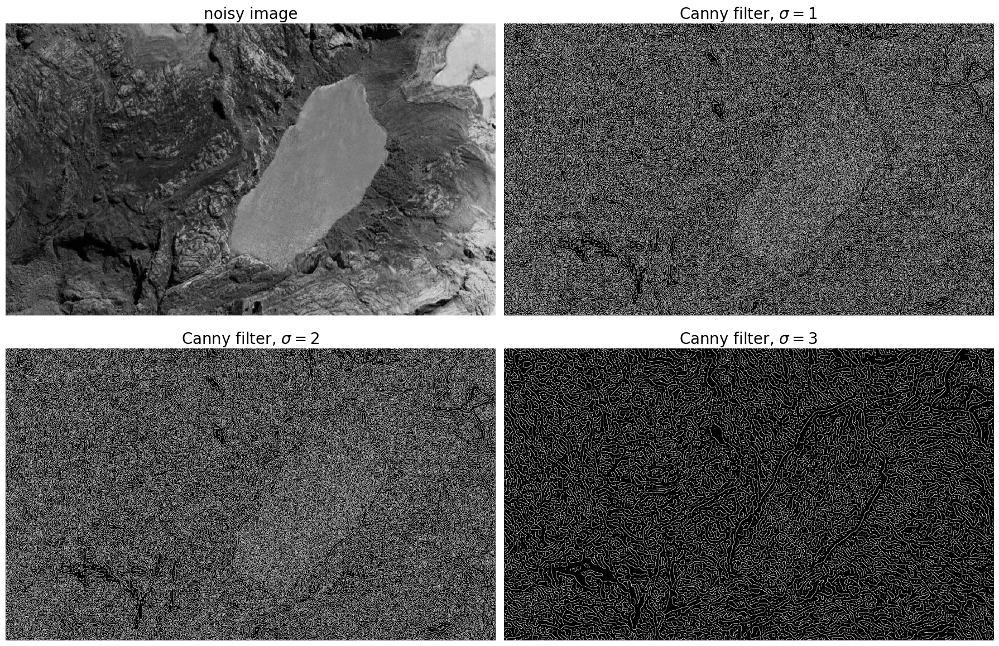

In [41]:
cannyImage(blueBand)

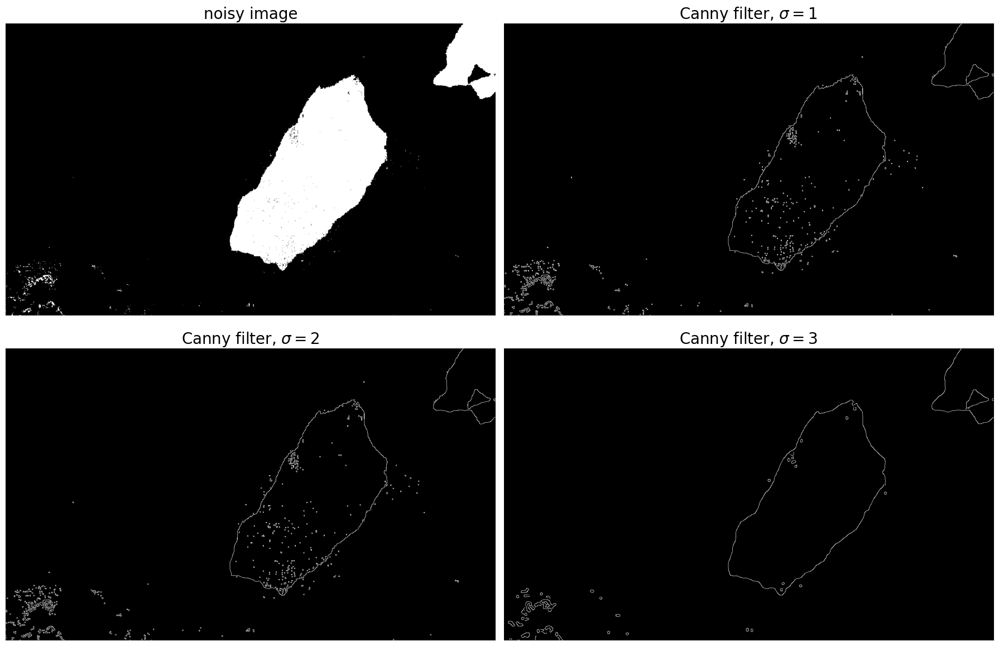

In [42]:
cannyImage(hatariIndex)

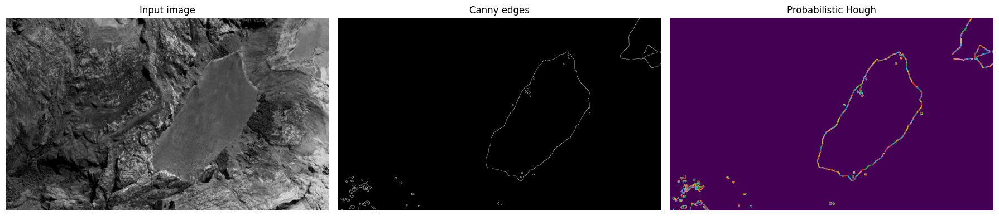

In [43]:
from skimage.transform import probabilistic_hough_line
from matplotlib import cm

lines = probabilistic_hough_line(edgesS3, threshold=2, line_length=2,
                                 line_gap=1)

# Generating figure 2
fig, axes = plt.subplots(1, 3, figsize=(18, 12), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(redBand, cmap=cm.gray)
ax[0].set_title('Input image')

ax[1].imshow(edgesS3, cmap=cm.gray)
ax[1].set_title('Canny edges')

ax[2].imshow(edgesS3 * 0)
for line in lines:
    p0, p1 = line
    ax[2].plot((p0[0], p1[0]), (p0[1], p1[1]))
ax[2].set_xlim((0, redBand.shape[1]))
ax[2].set_ylim((redBand.shape[0], 0))
ax[2].set_title('Probabilistic Hough')

for a in ax:
    a.set_axis_off()

plt.tight_layout()
plt.show()

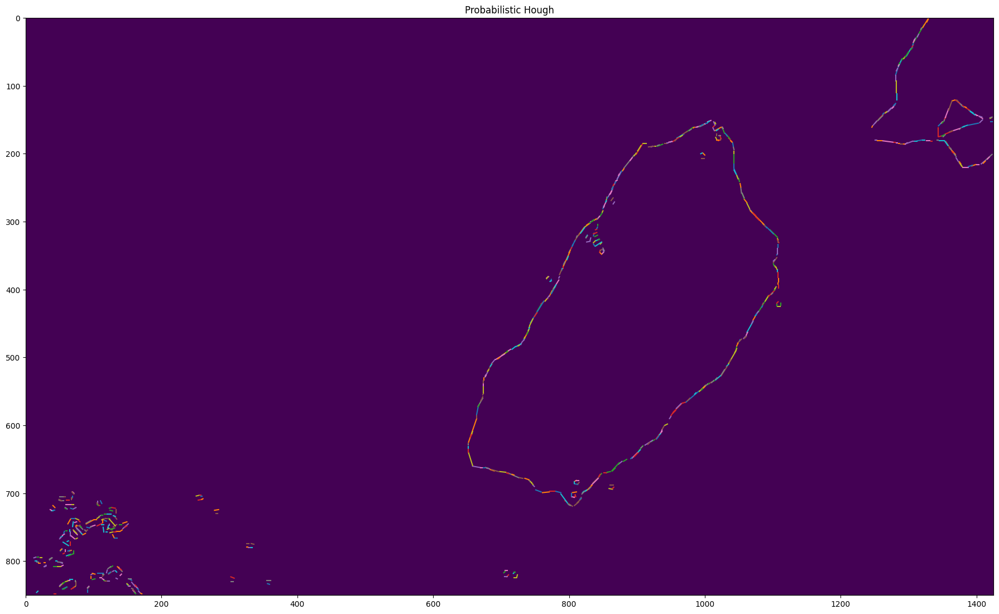

In [44]:
# Generating figure 2
fig, ax = plt.subplots(1,1,figsize=(18, 12))

ax.imshow(edgesS3 * 0)
for line in lines:
    p0, p1 = line
    ax.plot((p0[0], p1[0]), (p0[1], p1[1]))
ax.set_xlim((0, redBand.shape[1]))
ax.set_ylim((redBand.shape[0], 0))
ax.set_title('Probabilistic Hough')

plt.tight_layout()
plt.show()

In [45]:
#transform one line vertex to xy
lakeImage.xy(lines[0][0][1],lines[0][0][0])

(np.float64(-77.54736354907895), np.float64(-9.187924538842106))

In [46]:
def transformLine(line):
    c0, r0 = line[0]
    c1, r1 = line[1]
    xy0 = lakeImage.xy(r0,c0)
    xy1 = lakeImage.xy(r1,c1)
    return [xy0,xy1]

In [47]:
transformLine(lines[0])

[(np.float64(-77.54736354907895), np.float64(-9.187924538842106)),
 (np.float64(-77.54729917302632), np.float64(-9.187860162789473))]

In [48]:
#create line shapefile
import fiona

# define schema
schema = {
    'geometry':'LineString',
    'properties':[('ID','int')]
}

#open a fiona object
lineShp = fiona.open('../Data/Shp/lakeLine.shp', mode='w', driver='ESRI Shapefile',
          schema = schema, crs = "EPSG:4326")

ModuleNotFoundError: No module named 'fiona'

In [ ]:
#get list of points
xyList = []
rowName = ''
for index, line in enumerate(lines):
    xyList = transformLine(line)
    
    rowDict = {
                'geometry' : {'type':'LineString',
                                 'coordinates': xyList},
                'properties': {'ID' : index},
                }
    lineShp.write(rowDict)

lineShp.close()